In [1]:
from dask.distributed import Client

client = Client("tcp://127.0.0.1:36623")
client

<Client: 'tcp://127.0.0.1:36623' processes=8 threads=32, memory=125.85 GiB>

In [2]:
import numpy as np
import xarray as xr
from MITgcmutils import rdmds
from xmitgcm import open_mdsdataset
from xgcm.grid import Grid
import os.path as op
# from xmovie import Movie
import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
import warnings
warnings.filterwarnings("ignore")

In [4]:
ddir = '/tank/spectre/RUNS/'
gdir = '/tank/spectre/RUNS/grid/'

In [5]:
#-- some parameters --
nt = 73         #also need earlier and past year for interpolation, 
                #for now it is coded in a 'normal year' fashion
# nproc = 36      #number of processors used for parallelization 

#-- time param for loading --
dt = 80                #1/12 model time step
spy = 86400*365
dump = 5*86400       #5-d dumps
d_iter = dump/dt
nDump = spy/dump

iper = 2005
offset = int((iper-2002)*spy/dt)
# iters = np.arange(d_iter, (nDump+1)*d_iter, d_iter, dtype='int') + offset
iters = (np.arange(d_iter, (nDump+1)*d_iter, d_iter, dtype='int') 
         + offset) 
# - int(d_iter)
# dd0 = 21
dd = 60
iters[dd:]

array([1512000, 1517400, 1522800, 1528200, 1533600, 1539000, 1544400,
       1549800, 1555200, 1560600, 1566000, 1571400, 1576800])

In [6]:
md = 14
dsg = open_mdsdataset(op.join(ddir,'%04d/memb%03d/00' % (2003,md)), 
                      grid_dir=gdir,
                      prefix=[], 
                      delta_t=dt , iters=iters[0]                              
                     )
dsg

<xarray.Dataset> Size: 2GB
Dimensions:  (time: 1, XC: 2052, YC: 1000, XG: 2052, YG: 1000, Z: 75, Zp1: 76,
              Zu: 75, Zl: 75)
Coordinates: (12/33)
    iter     (time) int64 8B 1188000
  * time     (time) timedelta64[ns] 8B 1100 days
  * XC       (XC) >f4 8kB 278.4 278.4 278.5 278.5 ... 319.4 319.4 319.4 319.4
  * YC       (YC) >f4 4kB 25.51 25.53 25.55 25.57 ... 45.43 45.45 45.47 45.49
  * XG       (XG) >f4 8kB 278.4 278.4 278.4 278.5 ... 319.4 319.4 319.4 319.4
  * YG       (YG) >f4 4kB 25.5 25.52 25.54 25.56 ... 45.42 45.44 45.46 45.48
    ...       ...
    maskW    (Z, YC, XG) bool 154MB dask.array<chunksize=(75, 1000, 2052), meta=np.ndarray>
    maskS    (Z, YG, XC) bool 154MB dask.array<chunksize=(75, 1000, 2052), meta=np.ndarray>
    maskInC  (YC, XC) bool 2MB dask.array<chunksize=(1000, 2052), meta=np.ndarray>
    maskInS  (YG, XC) bool 2MB dask.array<chunksize=(1000, 2052), meta=np.ndarray>
    maskInW  (YC, XG) bool 2MB dask.array<chunksize=(1000, 2052), meta=np.ndarray>
    rhoRef   (Z) >f4 300B 1.021e+03 1.021e+03 1.021e+03 ... 1.044e+03 1.045e+03
Data variables:
    *empty*
Attributes:
    Conventions:  CF-1.6
    title:        netCDF wrapper of MITgcm MDS binary data
    source:       MITgcm
    history:      Created by calling `open_mdsdataset(data_dir='/tank/spectre...

In [7]:
for md in np.concatenate((np.arange(24),np.arange(36,60))):
# for md in np.arange(16):
    
    iid = 0
    for ii in iters:
        
        fname = op.join(ddir,'%4d/memb%03d/Snap%010i.zarr' 
                        % (iper,md,ii) 
                       )
        fname_new = op.join(ddir,'%4d/memb%03d_new/Snap%010i.zarr' 
                        % (iper,md,ii) 
                       )
        if op.exists(fname):
            iid += 1
        elif op.exists(fname_new):
            iid += 1
        else:
            print(fname)
        
        
    print("nmemb:", md, "# of files", iid)

nmemb: 0 # of files 73
nmemb: 1 # of files 73
nmemb: 2 # of files 73
nmemb: 3 # of files 73
nmemb: 4 # of files 73
nmemb: 5 # of files 73
nmemb: 6 # of files 73
nmemb: 7 # of files 73
nmemb: 8 # of files 73
nmemb: 9 # of files 73
nmemb: 10 # of files 73
nmemb: 11 # of files 73
nmemb: 12 # of files 73
nmemb: 13 # of files 73
nmemb: 14 # of files 73
nmemb: 15 # of files 73
nmemb: 16 # of files 73
nmemb: 17 # of files 73
nmemb: 18 # of files 73
nmemb: 19 # of files 73
nmemb: 20 # of files 73
nmemb: 21 # of files 73
nmemb: 22 # of files 73
nmemb: 23 # of files 73
nmemb: 36 # of files 73
nmemb: 37 # of files 73
nmemb: 38 # of files 73
nmemb: 39 # of files 73
nmemb: 40 # of files 73
nmemb: 41 # of files 73
nmemb: 42 # of files 73
nmemb: 43 # of files 73
nmemb: 44 # of files 73
nmemb: 45 # of files 73
nmemb: 46 # of files 73
nmemb: 47 # of files 73
nmemb: 48 # of files 73
nmemb: 49 # of files 73
nmemb: 50 # of files 73
nmemb: 51 # of files 73
nmemb: 52 # of files 73
nmemb: 53 # of files 73
nm

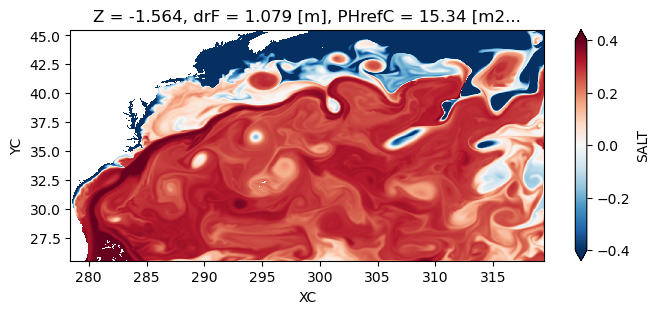

1188000


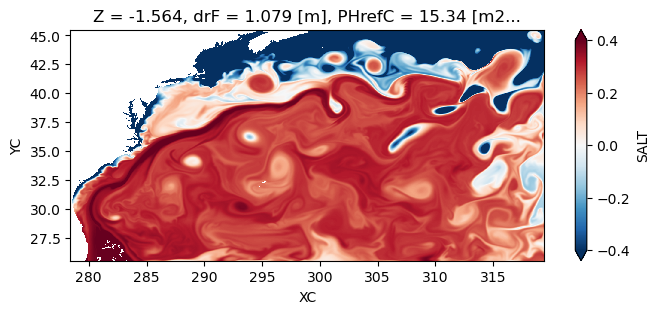

1193400


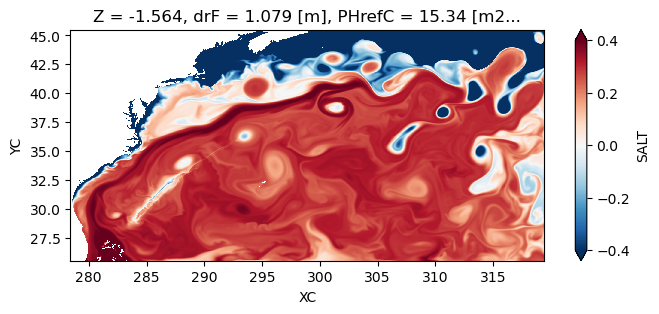

1198800


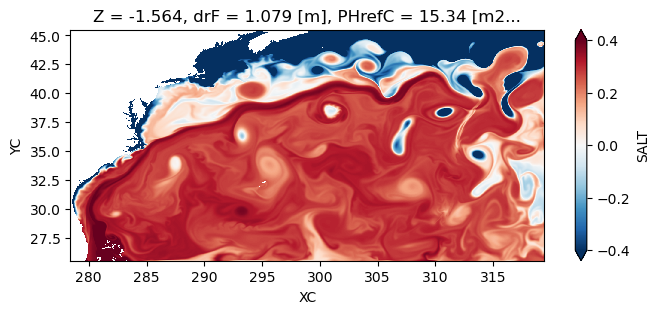

1204200


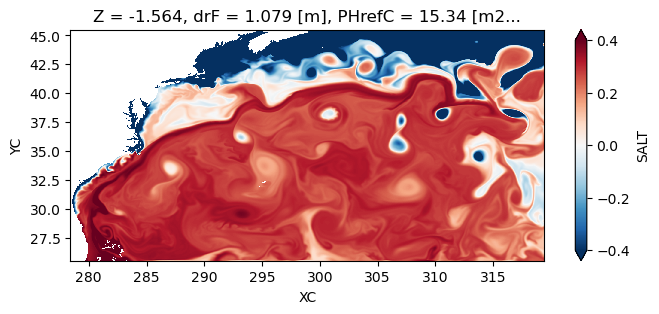

1209600


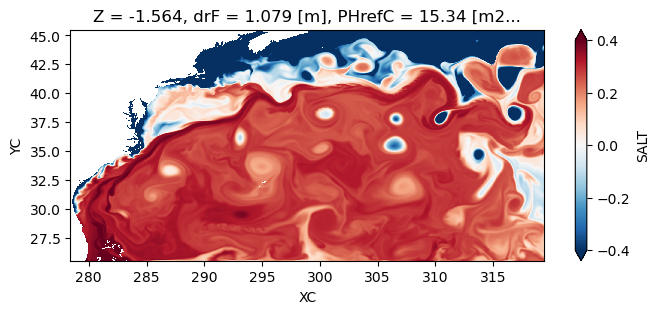

1215000


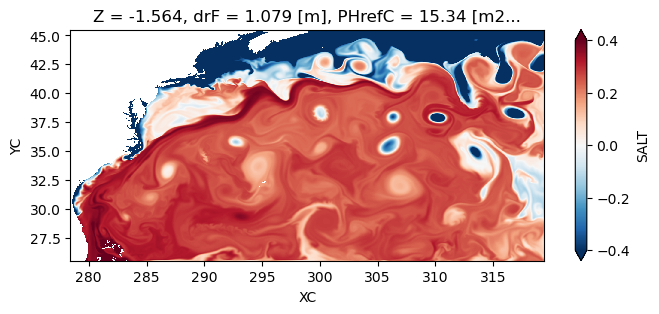

1220400


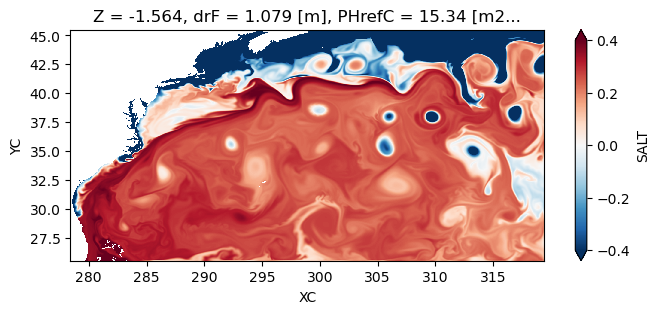

1225800


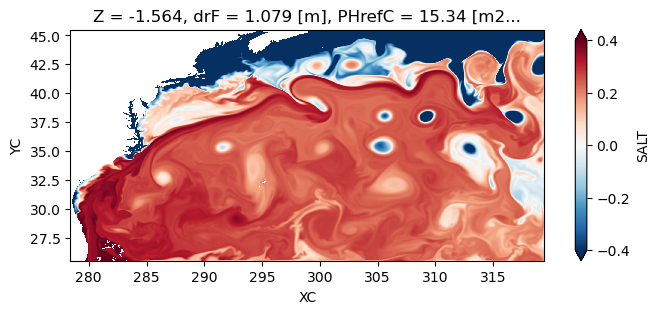

1231200


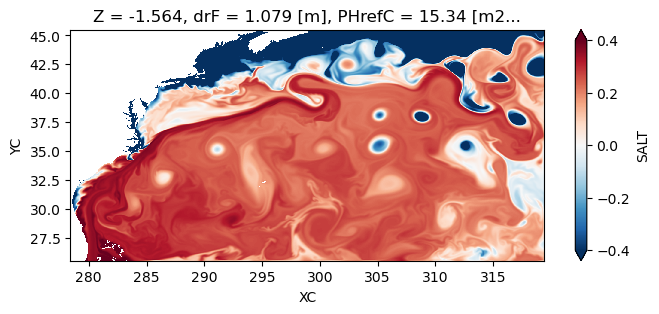

1236600


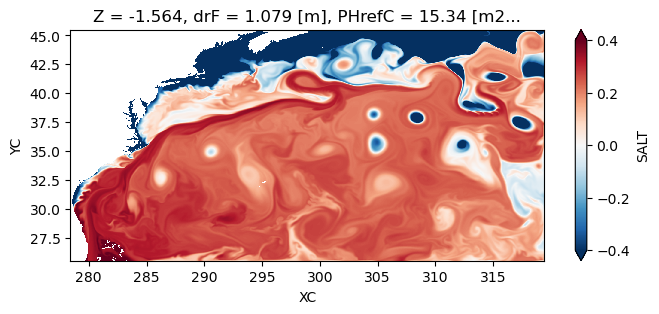

1242000


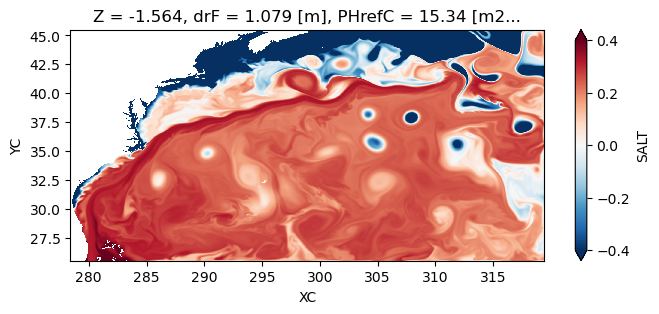

1247400


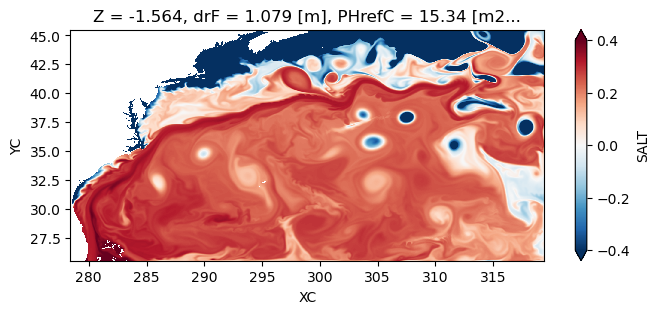

1252800


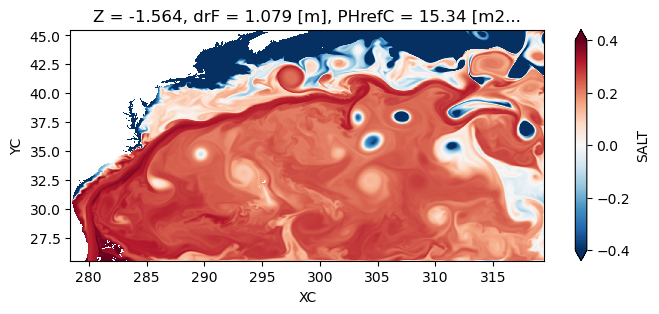

1258200


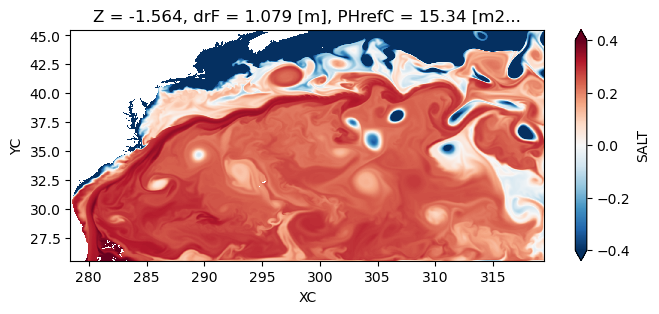

1263600


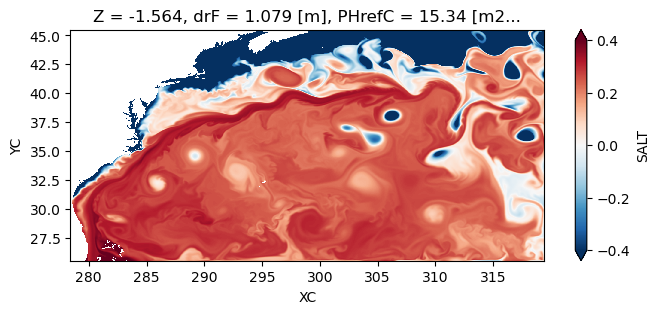

1269000


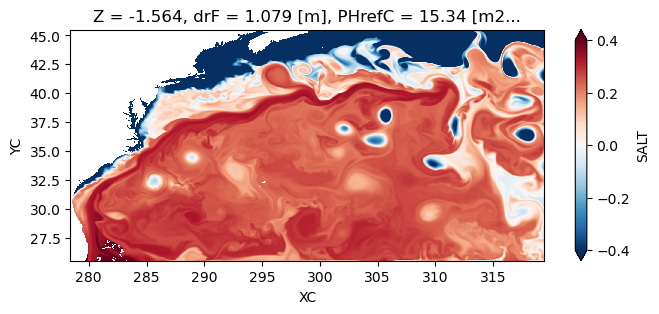

1274400


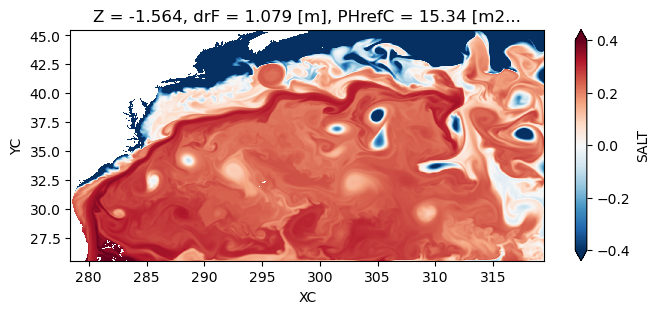

1279800


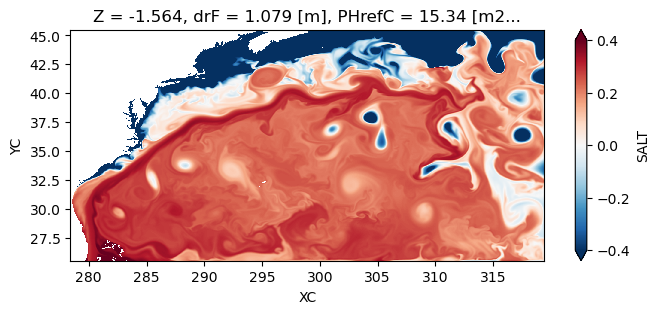

1285200


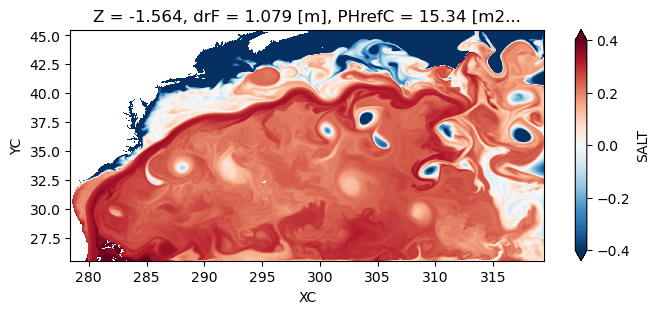

1290600


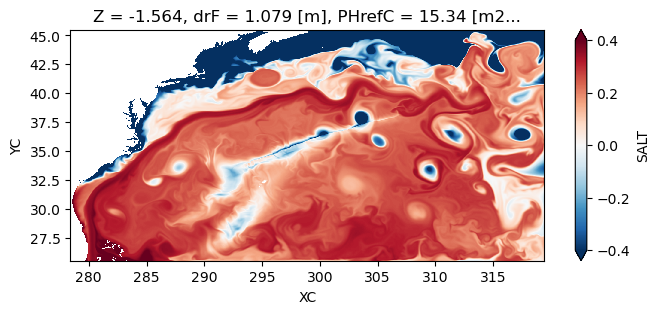

1296000


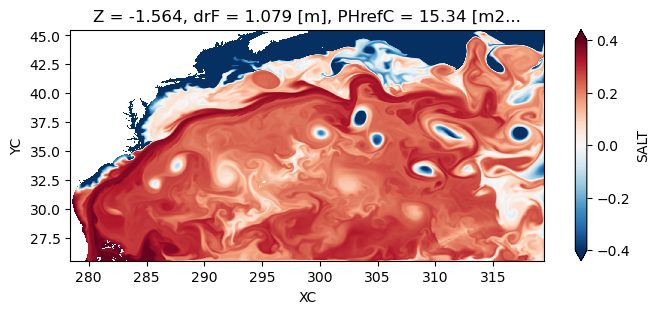

1301400


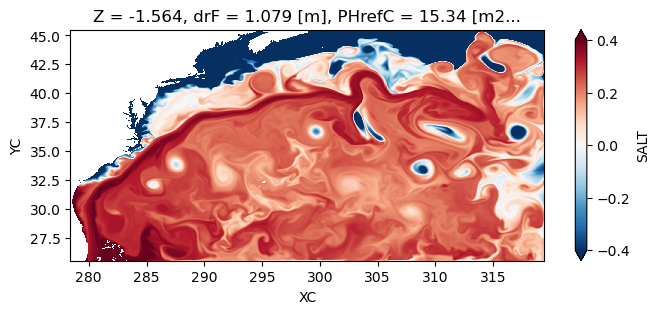

1306800


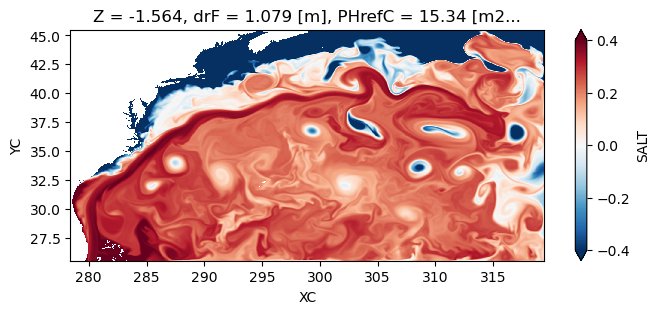

1312200


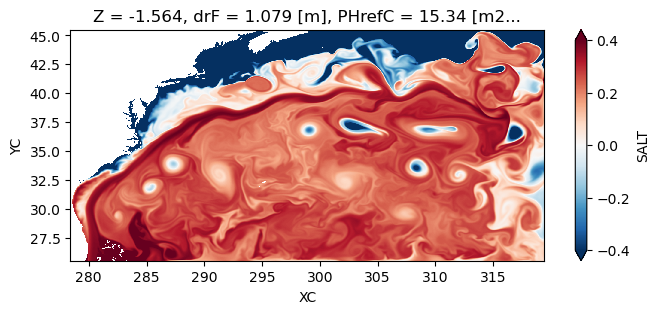

1317600


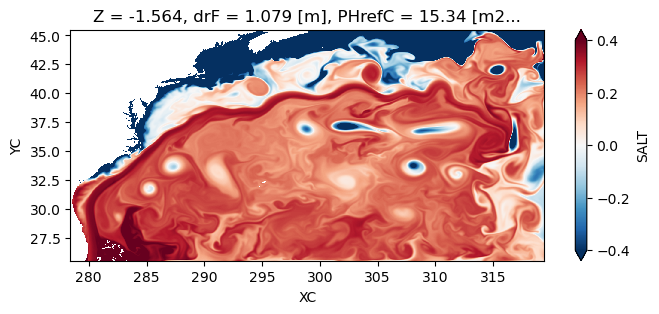

1323000


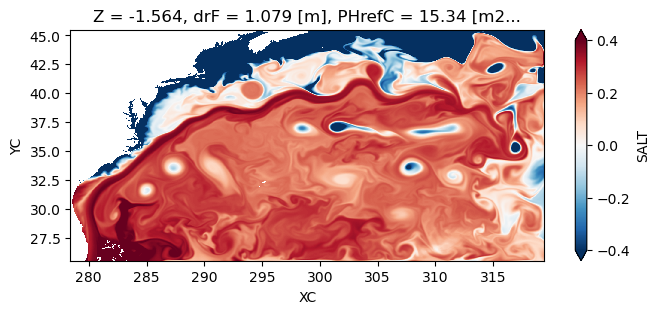

1328400


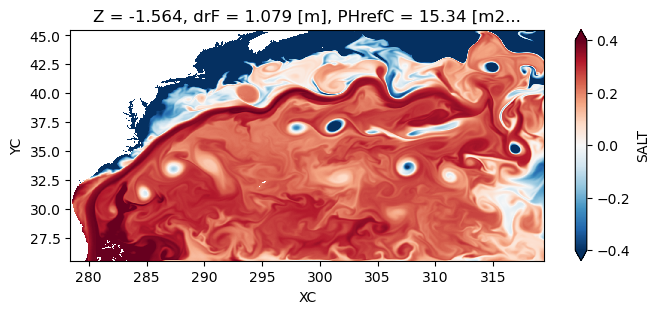

1333800


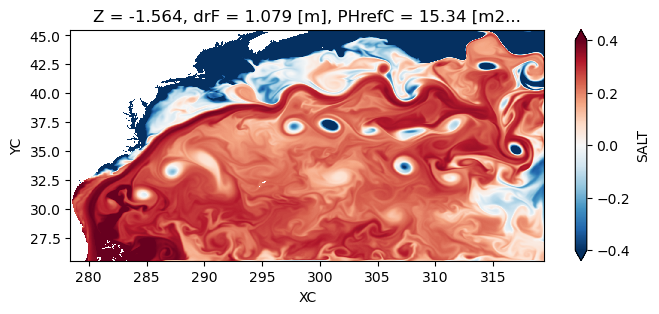

1339200


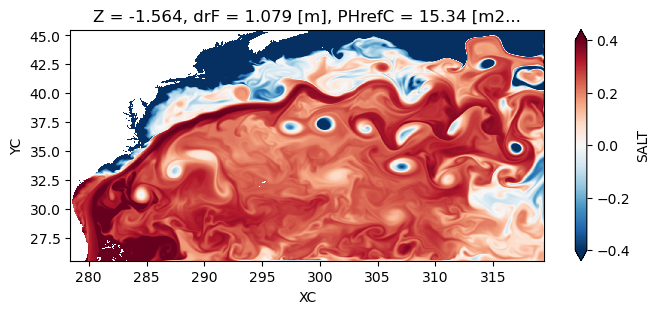

1344600


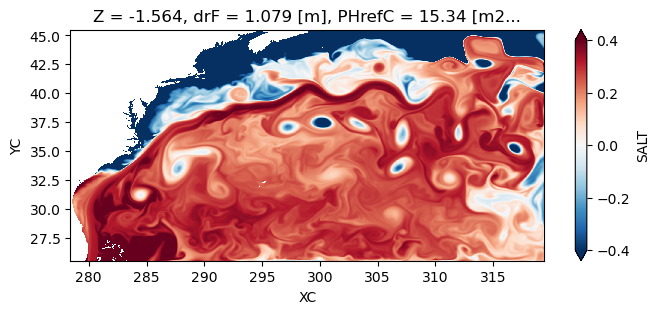

1350000


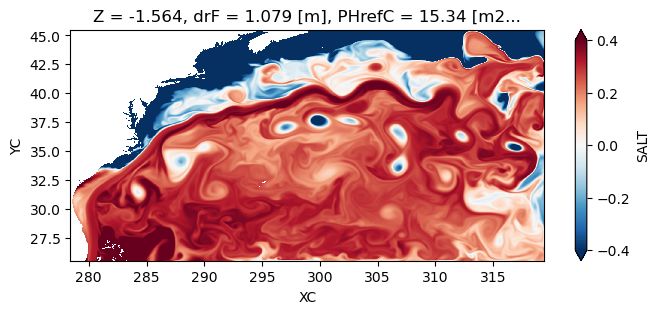

1355400


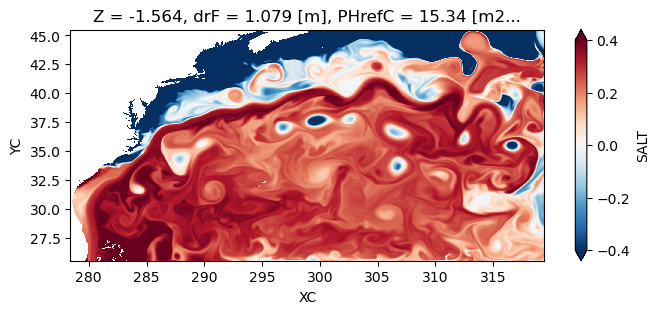

1360800


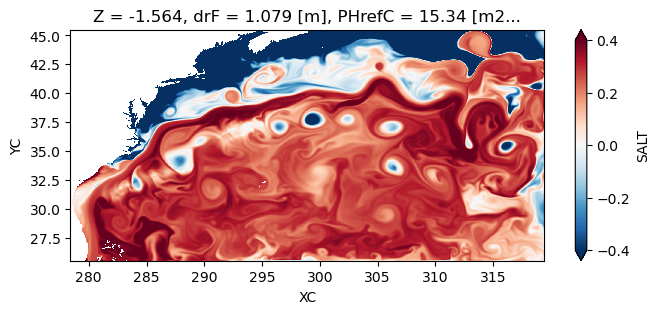

1366200


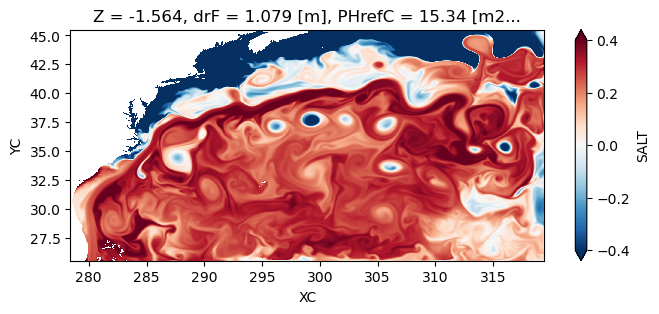

1371600


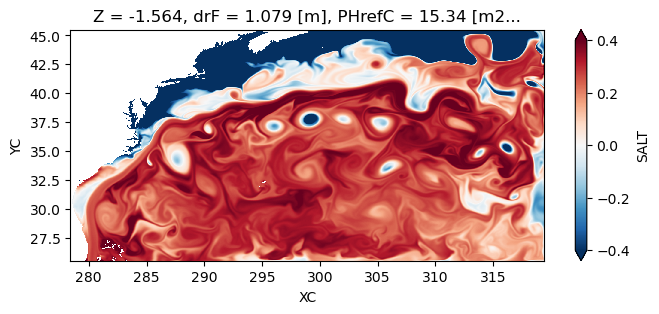

1377000


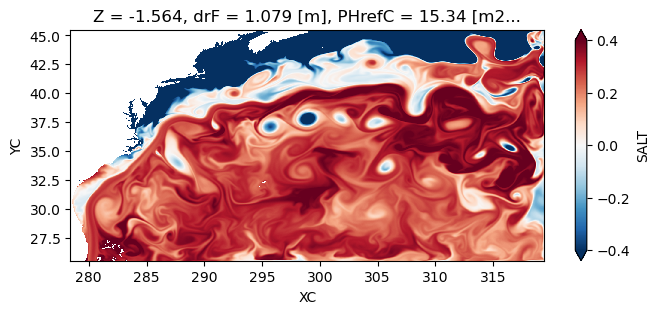

1382400


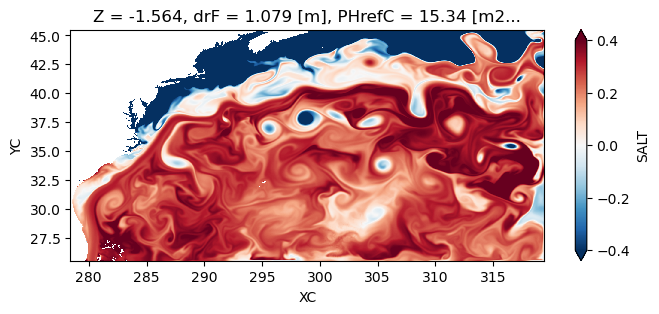

1387800


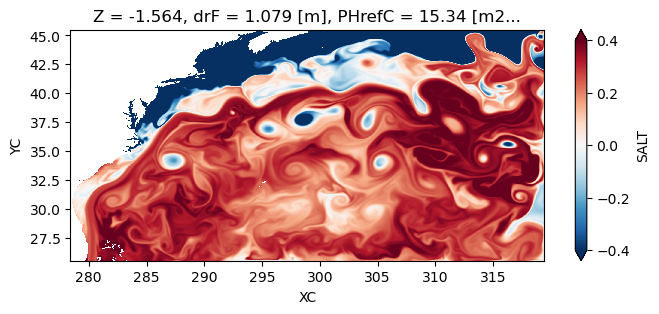

1393200


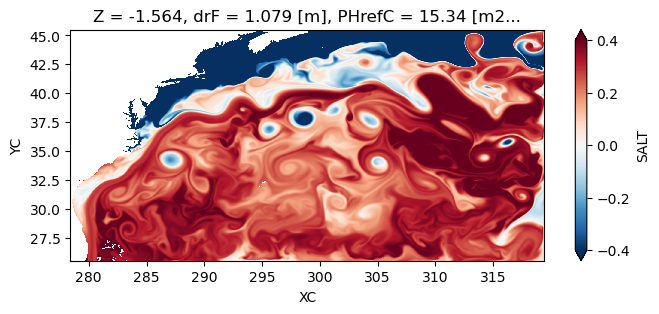

1398600


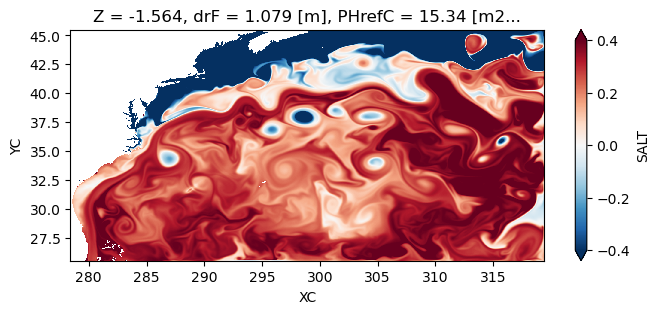

1404000


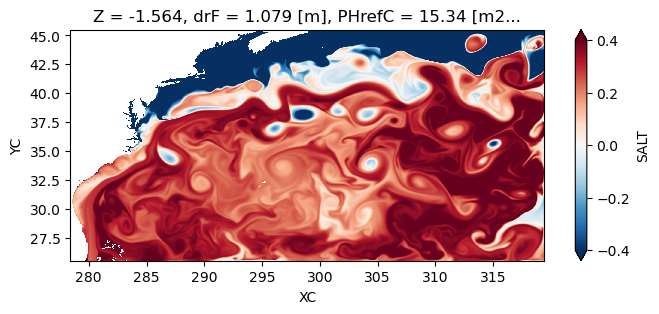

1409400


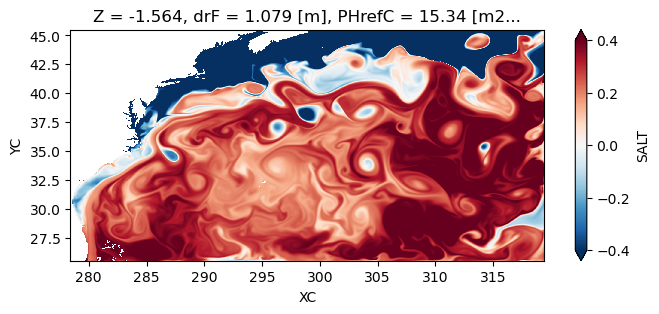

1414800


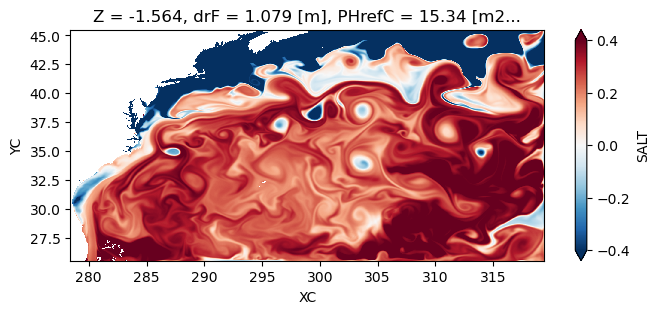

1420200


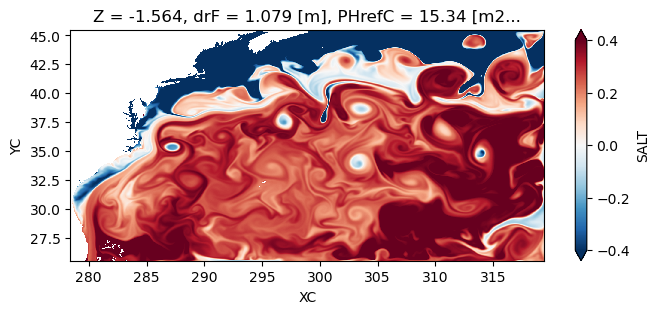

1425600


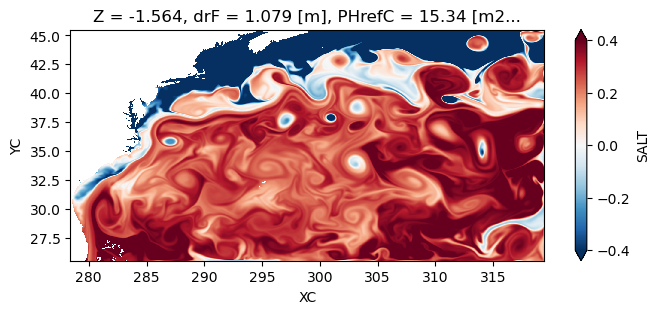

1431000


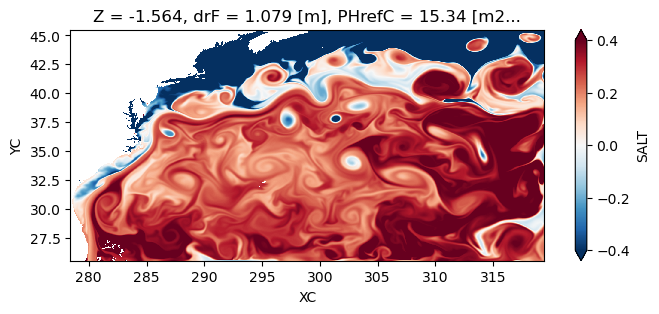

1436400


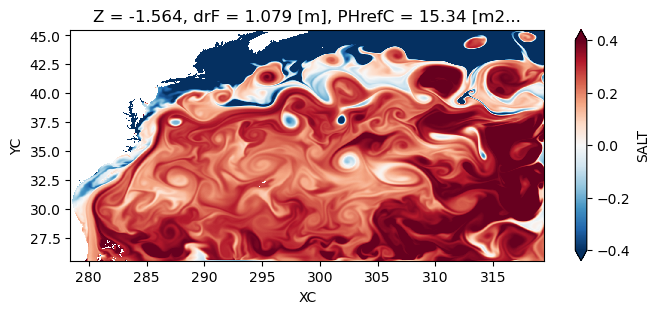

1441800


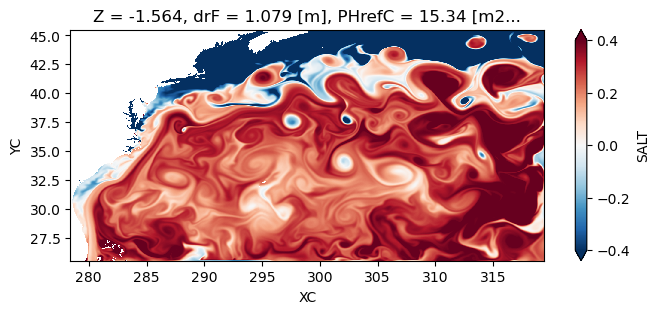

1447200


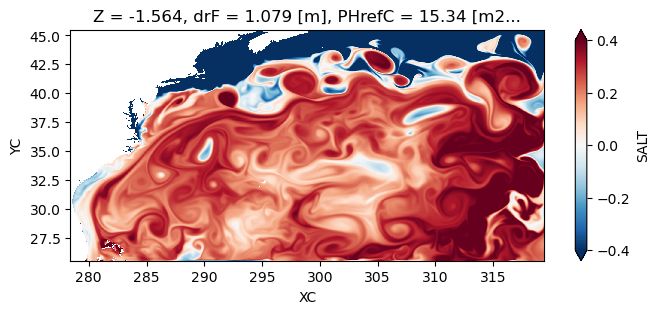

1452600


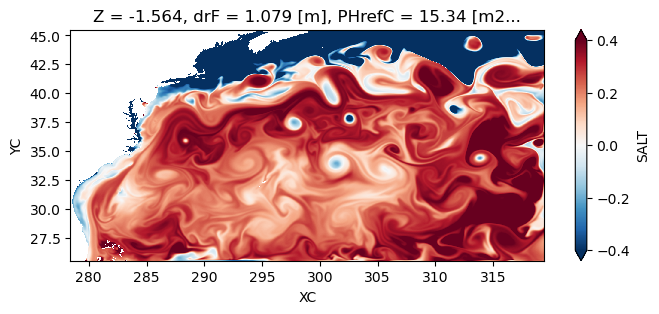

1458000


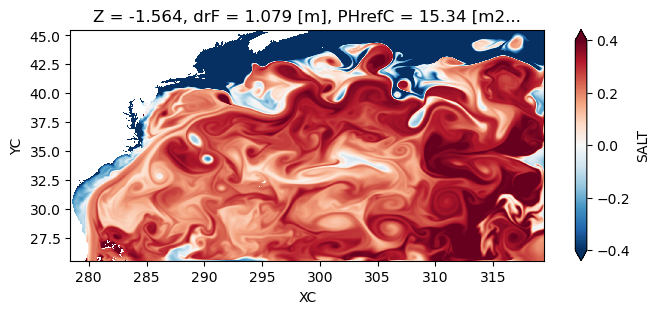

1463400


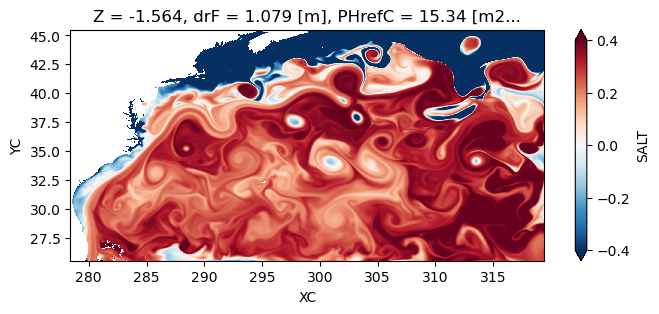

1468800


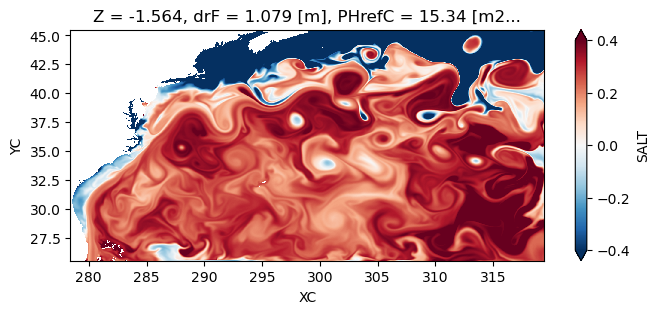

1474200


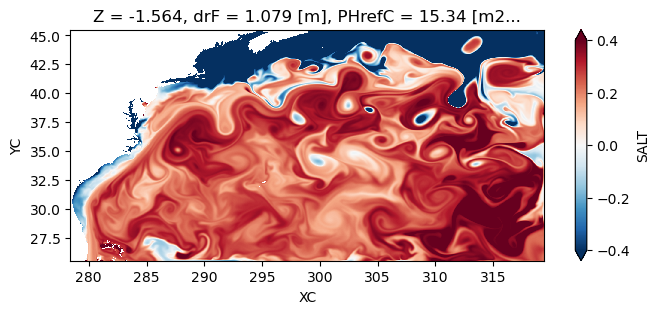

1479600


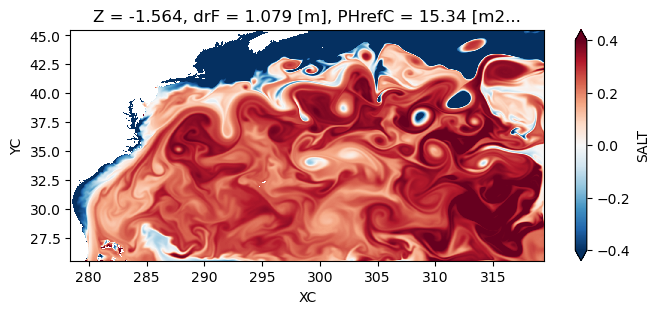

1485000


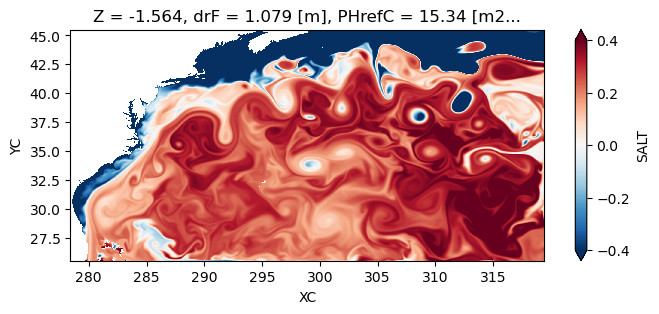

1490400


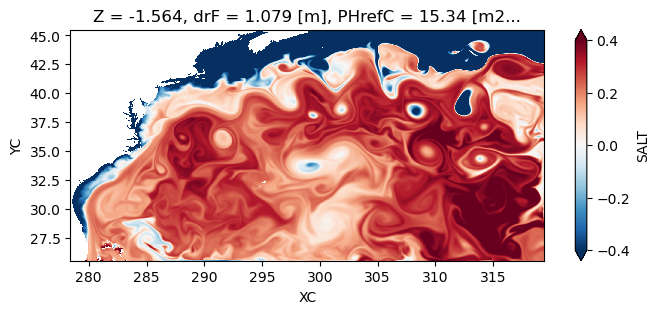

1495800


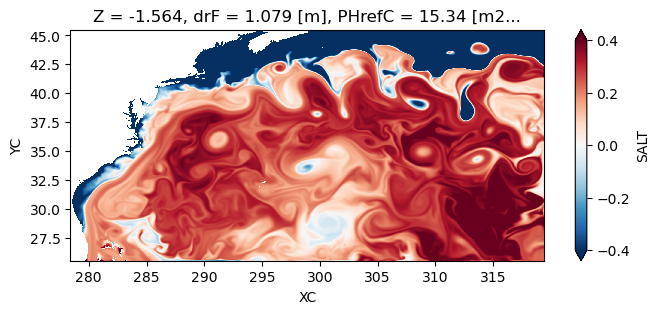

1501200


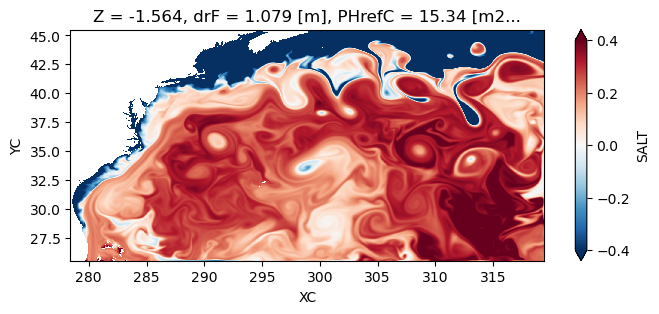

1506600


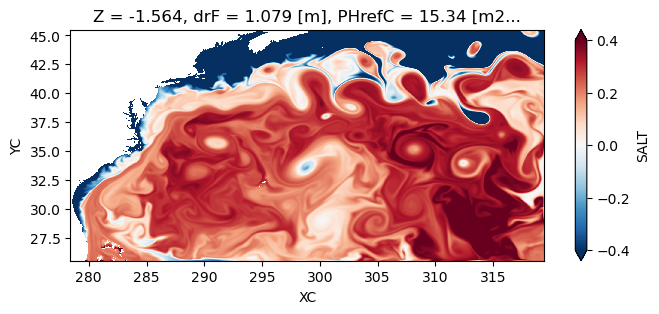

1512000


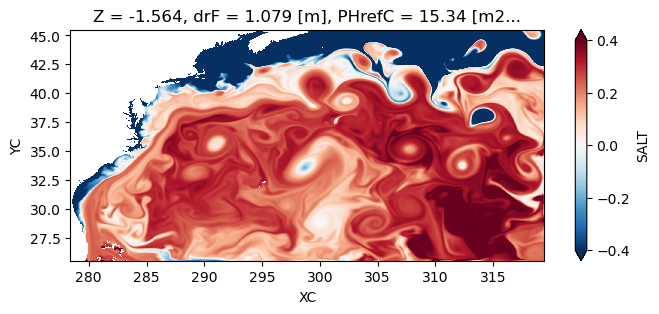

1517400


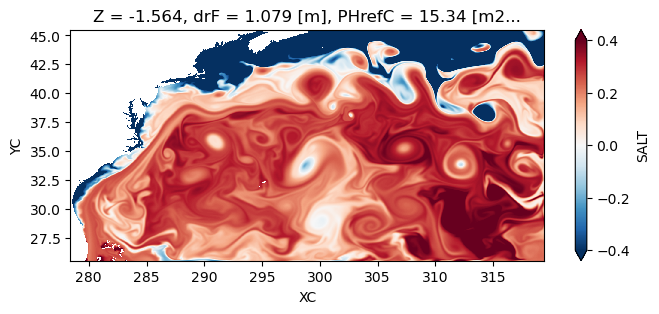

1522800


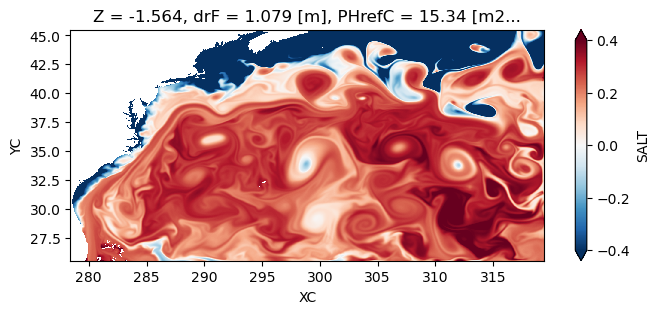

1528200


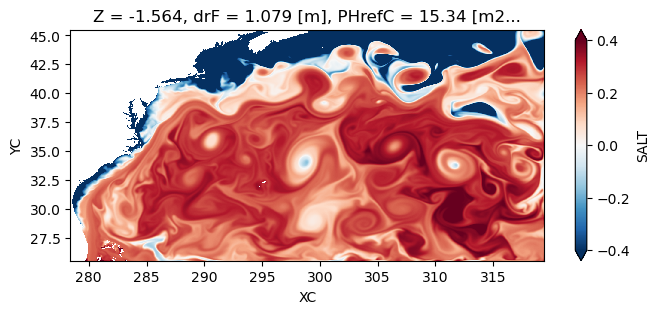

1533600


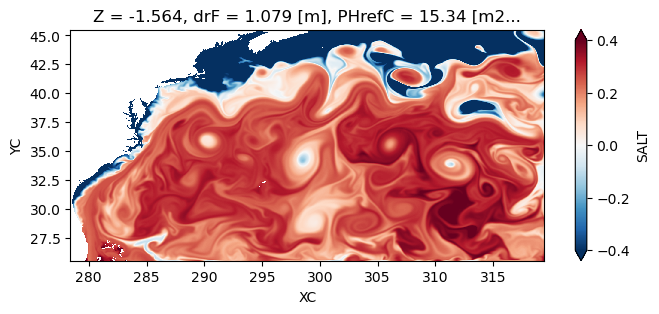

1539000


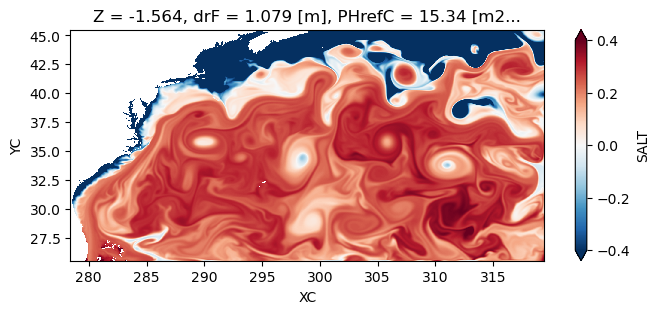

1544400


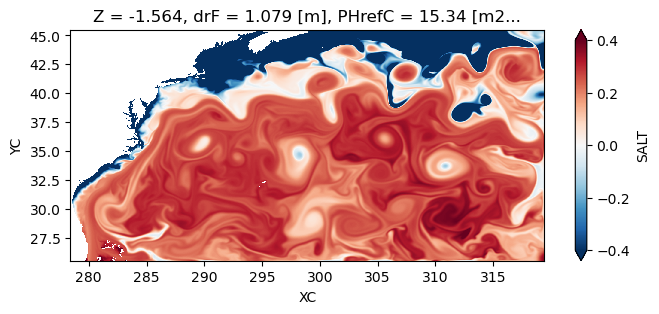

1549800


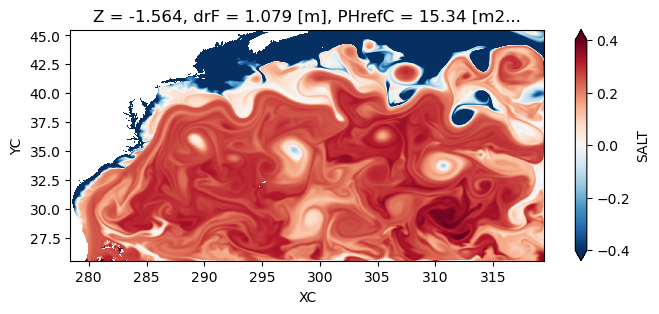

1555200


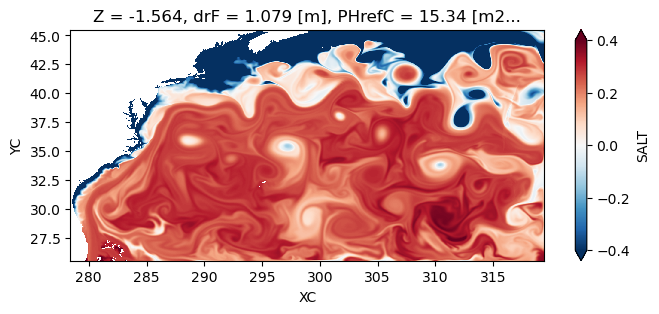

1560600


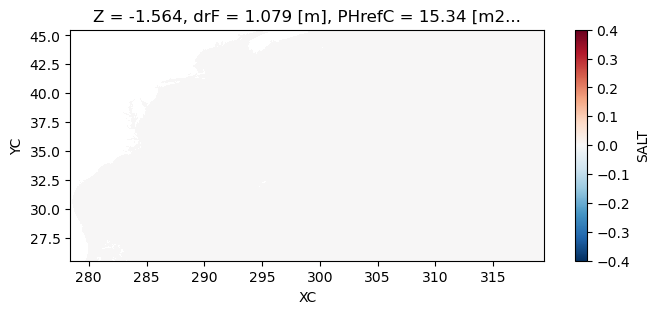

1566000


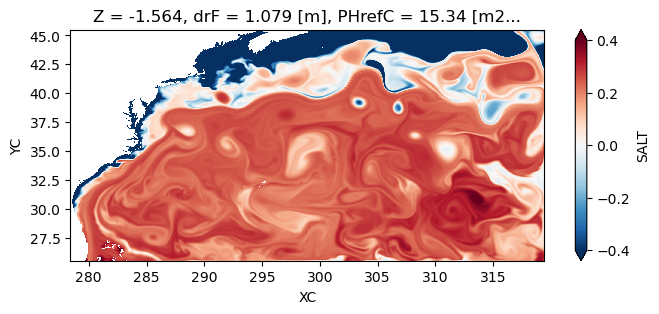

1571400


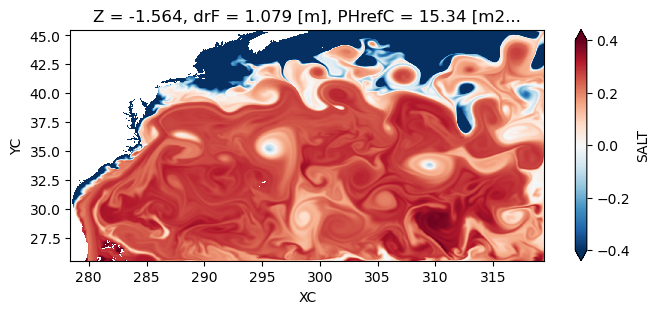

1576800


In [7]:
md = 15
# md = 15
for ii in iters[:]:
        
    ds = xr.open_zarr(op.join(ddir,'%4d/memb%03d/Snap%010i.zarr' 
                              % (iper,md,ii))
                     )

    fig, ax = plt.subplots(figsize=(8,3))
    (ds.SALT.where(dsg.maskC!=0.).isel(Z=1)
     - ds.SALT.where(dsg.maskC!=0.).isel(Z=1).mean(skipna=True)
    ).plot(ax=ax,rasterized=True, vmax=.4, vmin=-.4, cmap='RdBu_r')
    ax.set_aspect('equal')
    plt.show()
    ds.close()
    print(ii)
        
        # print(md)

## WRONG (old) RUN (memb 15)

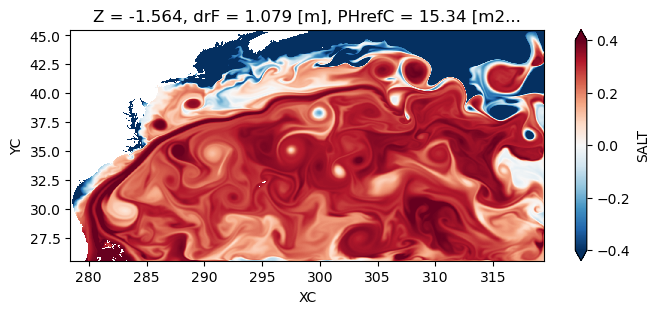

1117800


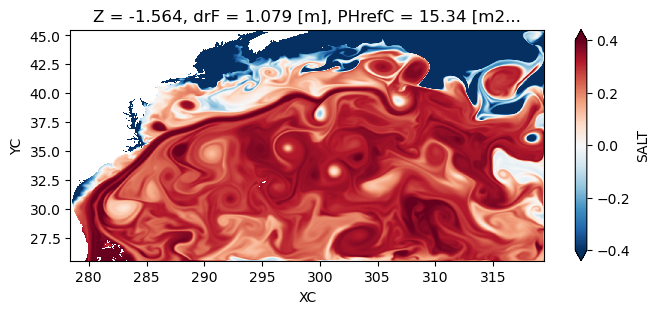

1123200


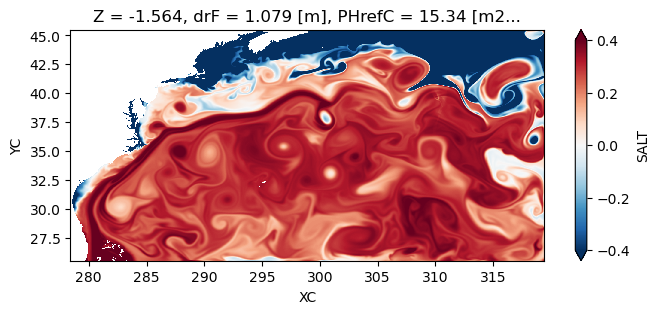

1128600


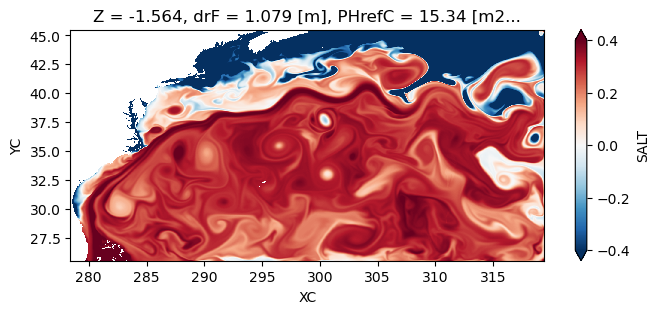

1134000


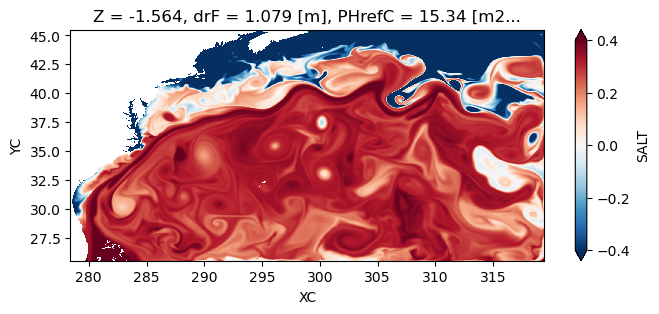

1139400


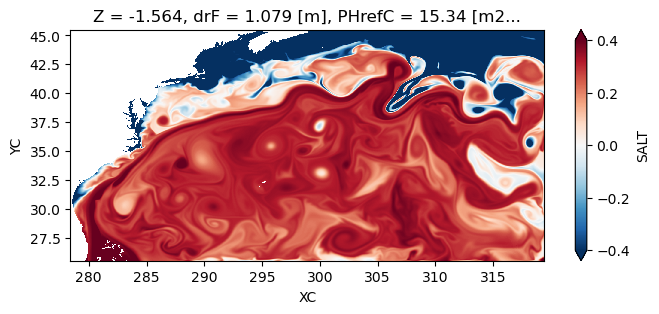

1144800


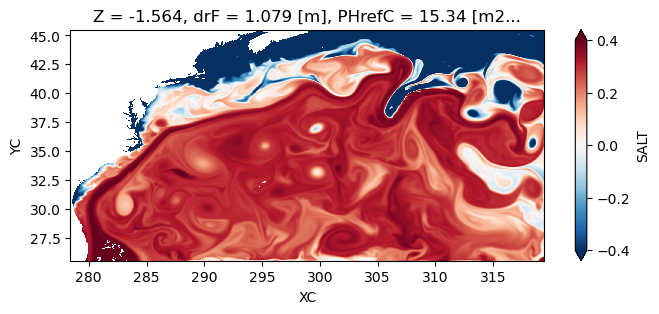

1150200


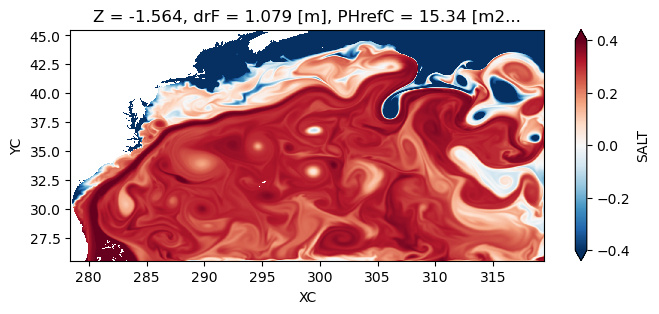

1155600


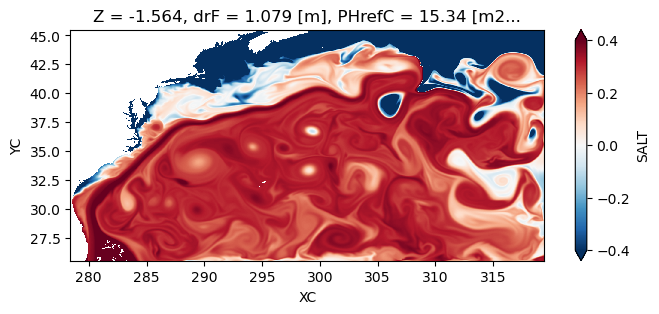

1161000


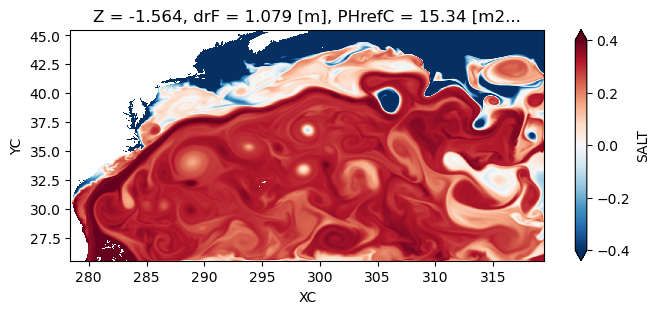

1166400


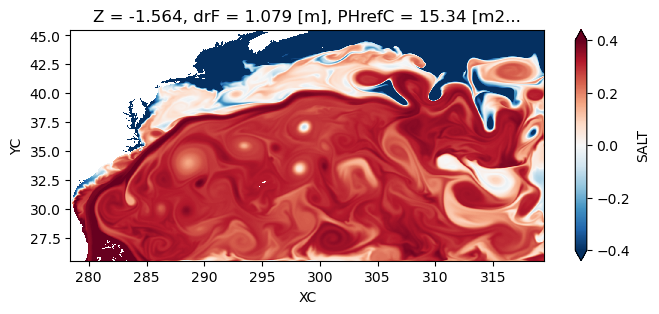

1171800


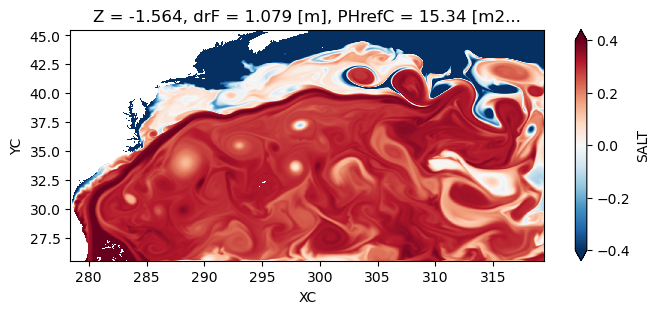

1177200


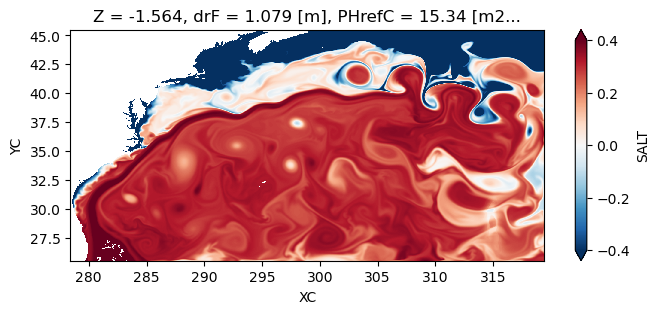

1182600


In [20]:
####### WRONG RUN #######
md = 15
for ii in iters[dd:]:
        
    ds = xr.open_zarr(op.join(ddir,'%4d/memb%03d/Snap%010i.zarr' 
                              % (iper,md,ii))
                     )

    fig, ax = plt.subplots(figsize=(8,3))
    (ds.SALT.where(dsg.maskC!=0.).isel(Z=1)
     - ds.SALT.where(dsg.maskC!=0.).isel(Z=1).mean(skipna=True)
    ).plot(ax=ax,rasterized=True, vmax=.4, vmin=-.4, cmap='RdBu_r')
    ax.set_aspect('equal')
    plt.show()
    ds.close()
    print(ii)
        
        # print(md)

## WRONG (old) RUN (memb 40)

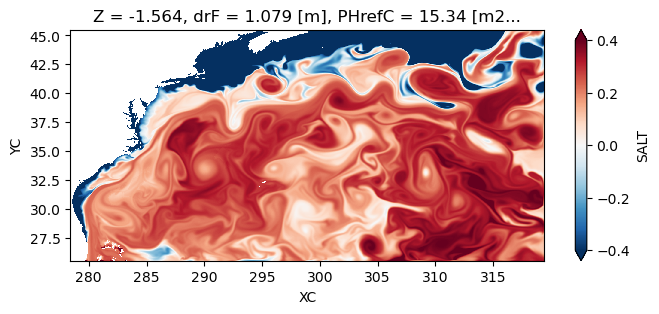

1512000


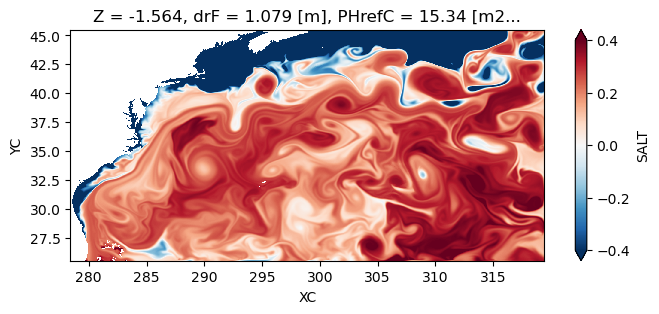

1517400


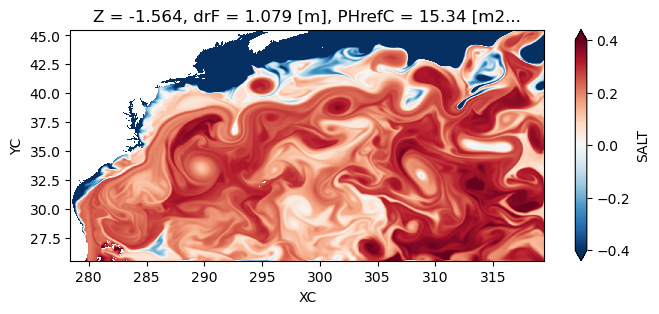

1522800


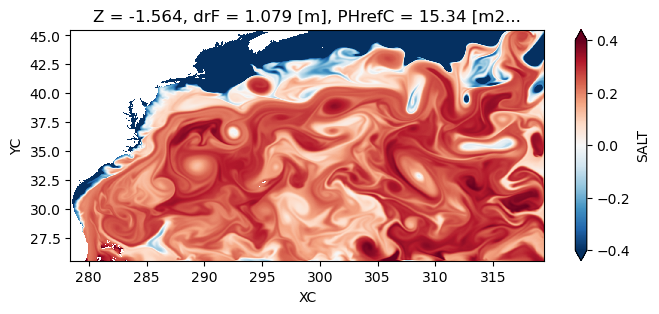

1528200


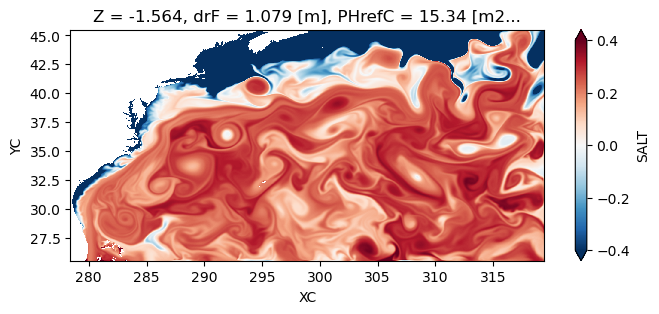

1533600


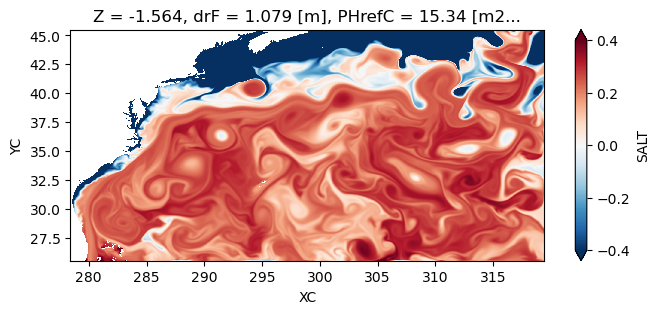

1539000


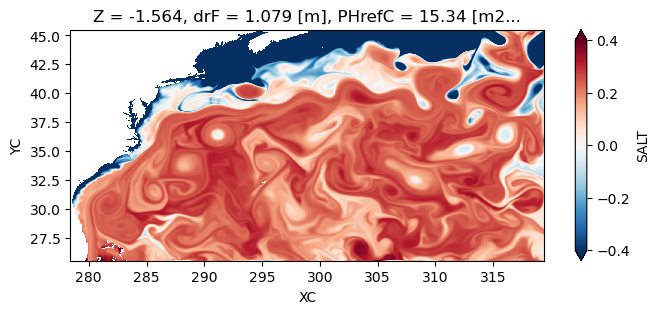

1544400


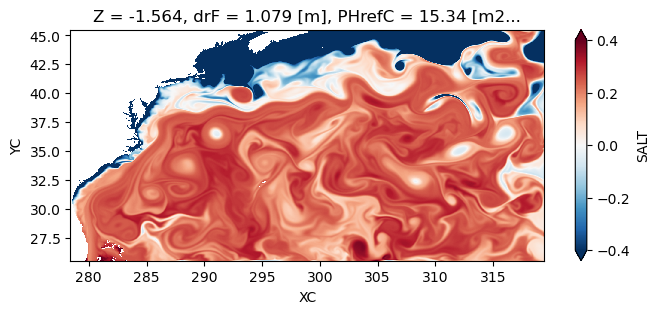

1549800


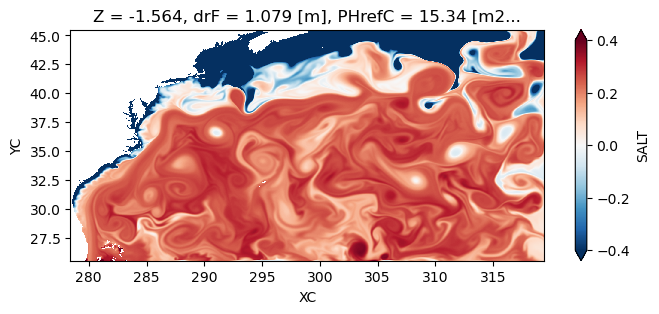

1555200


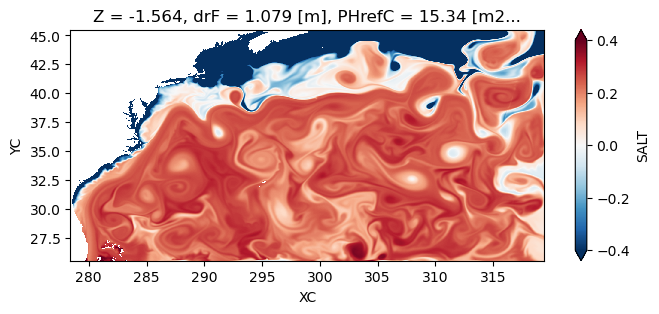

1560600


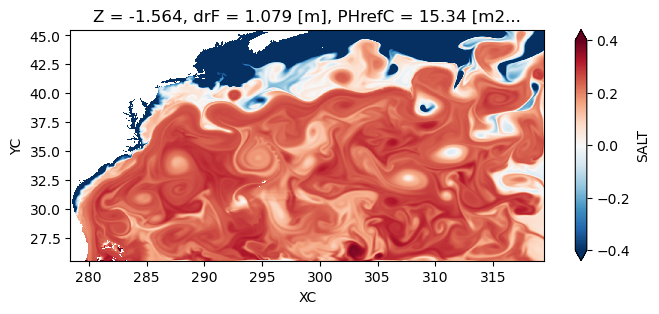

1566000


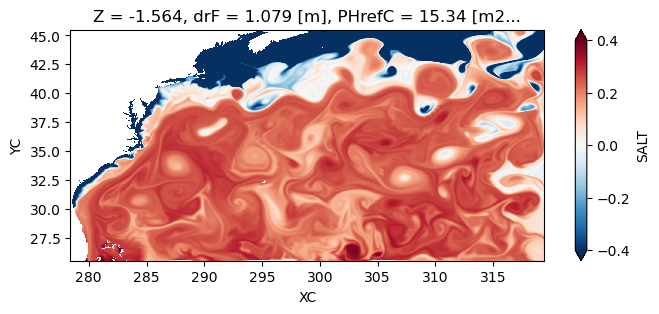

1571400


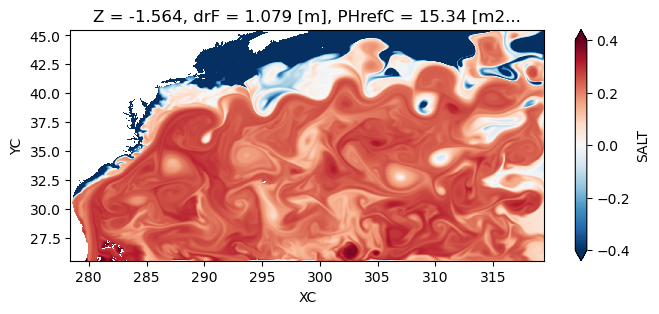

1576800


In [9]:
####### WRONG RUN #######
md = 40
for ii in iters[dd:]:
        
    ds = xr.open_zarr(op.join(ddir,'%4d/memb%03d/Snap%010i.zarr' 
                              % (iper,md,ii))
                     )

    fig, ax = plt.subplots(figsize=(8,3))
    (ds.SALT.where(dsg.maskC!=0.).isel(Z=1)
     - ds.SALT.where(dsg.maskC!=0.).isel(Z=1).mean(skipna=True)
    ).plot(ax=ax,rasterized=True, vmax=.4, vmin=-.4, cmap='RdBu_r')
    ax.set_aspect('equal')
    plt.show()
    ds.close()
    print(ii)
        
        # print(md)

In [18]:
# ds = xr.open_zarr(op.join(ddir,'%4d/memb%03d/Snap%010i.zarr' 
#                             % (iper,0,iters[0])),
#                  )
ds = xr.open_zarr(op.join(ddir,'%4d/memb%03d/continuity/Snap_cheapAML%010i.zarr' 
                            % (iper,0,iters[0])),
                 )
ds

<xarray.Dataset>
Dimensions:   (YC: 1000, XC: 2052)
Coordinates:
  * XC        (XC) float32 278.4 278.4 278.5 278.5 ... 319.4 319.4 319.4 319.4
  * YC        (YC) float32 25.51 25.53 25.55 25.57 ... 45.43 45.45 45.47 45.49
Data variables:
    Qair      (YC, XC) float32 dask.array<chunksize=(100, 100), meta=np.ndarray>
    Tair      (YC, XC) float32 dask.array<chunksize=(100, 100), meta=np.ndarray>
    gQairNm1  (YC, XC) float32 dask.array<chunksize=(100, 100), meta=np.ndarray>
    gTairNm1  (YC, XC) float32 dask.array<chunksize=(100, 100), meta=np.ndarray>

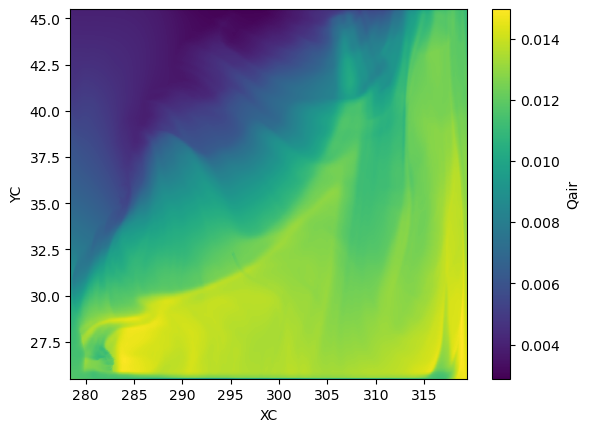

In [19]:
ds.Qair.plot()

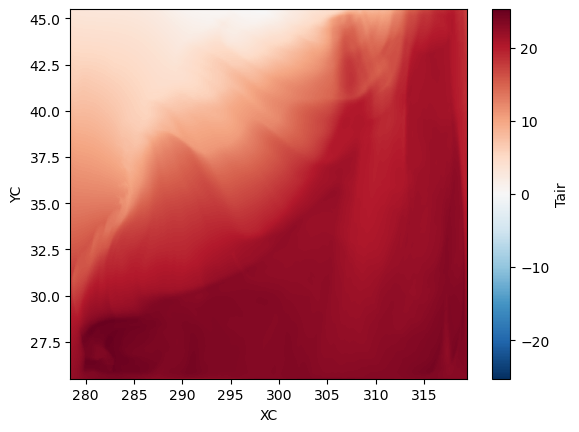

In [20]:
ds.Tair.plot()